In [2]:
using Pkg
Pkg.activate("../synthpop/models/FlockingModel")
Pkg.instantiate()

  Activating project at `~/code/synthpop/synthpop/models/FlockingModel`


In [3]:
using FlockingModel
using Plots

# A First Example

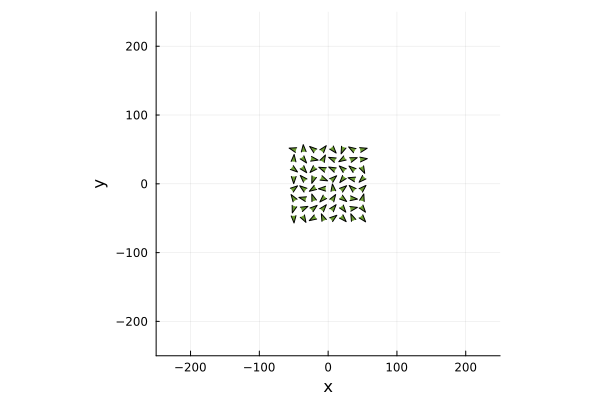

In [4]:
n = 64
k = 5
speed = 3.0
factors = [1.0; 0.25; 0.8; 0.5; 5.0]
radii = [10.0; 20.0; 25.0; 20.0; 5.0]
model = BoidModel(n, k, speed, factors, radii)
plot(model)

┌ Info: Saved animation to /Users/arnull/code/synthpop/notebooks/first_example.gif
└ @ Plots /Users/arnull/.julia/packages/Plots/3BCH5/src/animation.jl:156


Plots.AnimatedGif("/Users/arnull/code/synthpop/notebooks/first_example.gif")
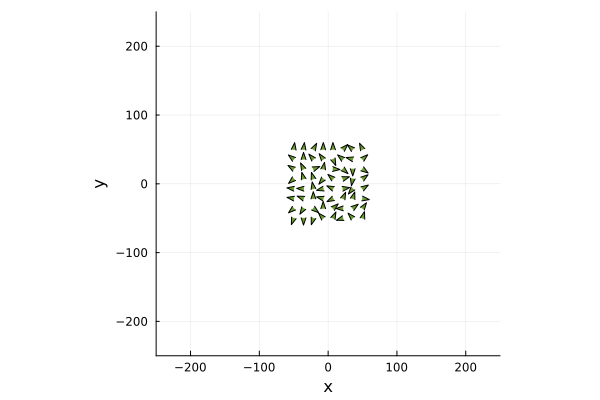

In [7]:
factor_fns = [stubborn_direction, cohere_direction, sep_direction, match_direction, avoid_direction]

anim = @animate for i in 1:1000
    update!(model, factor_fns)
    plot(model)
end

gif(anim, "first_example.gif", fps = 24)

# Stubborness

Stubbornness controls a bird's tendency to keep flying in the same direction. The factor function for stubborness (called `stubborn_direction`) simply returns the bird's current velocity.

┌ Info: Saved animation to /Users/arnull/code/synthpop/notebooks/stubborn.gif
└ @ Plots /Users/arnull/.julia/packages/Plots/3BCH5/src/animation.jl:156


Plots.AnimatedGif("/Users/arnull/code/synthpop/notebooks/stubborn.gif")
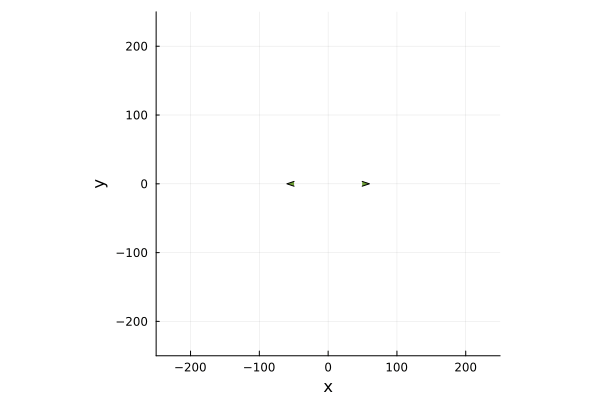

In [8]:
n = 2
k = 1
pos = [-50.0 0.0; 50.0 0.0]
vel = [-1.0 0.0 ; 1.0 0.0]
speed = 3.0
factors = [1.0]
radii = [10.0]
factor_fns = [stubborn_direction]

model = BoidModel(n, k, pos, vel, speed, factors, radii)

anim = @animate for i in 1:100
    update!(model, factor_fns)
    plot(model)
end

gif(anim, "stubborn.gif", fps = 24)

# Coherence

Coherence describes the tendency of bird's to move towards their neighbours. The factor function for coherence (called `cohere_direction`) first computes the average position of a bird's neighbors before returning the unit heading in that direction.

┌ Info: Saved animation to /Users/arnull/code/synthpop/notebooks/cohere.gif
└ @ Plots /Users/arnull/.julia/packages/Plots/3BCH5/src/animation.jl:156


Plots.AnimatedGif("/Users/arnull/code/synthpop/notebooks/cohere.gif")
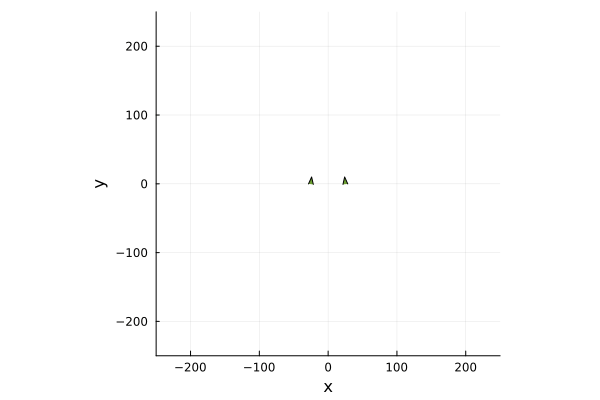

In [9]:
vel = [1.0 0.0; 1.0 0.0]
pos = [-5.0 0.0; 5.0 0.0]

n = 2
k = 2
pos = [-25.0 0.0; 25.0 0.0]
vel = [0.0 1.0 ; 0.0 1.0]
speed = 3.0
factors = [1.0; 0.1]
radii = [10.0; 50.0]
factor_fns = [stubborn_direction, cohere_direction]

model = BoidModel(n, k, pos, vel, speed, factors, radii)

anim = @animate for i in 1:100
    update!(model, factor_fns)
    plot(model)
end

gif(anim, "cohere.gif", fps = 24)

# Separation

Separation measures a bird's tendency to avoid other birds that are too close. The separtion factor function (`separtion_direction`) first computes the headings of the bird to each of its neighbours. It then normalises these headings and returns the negative average.

┌ Info: Saved animation to /Users/arnull/code/synthpop/notebooks/separation.gif
└ @ Plots /Users/arnull/.julia/packages/Plots/3BCH5/src/animation.jl:156


Plots.AnimatedGif("/Users/arnull/code/synthpop/notebooks/separation.gif")
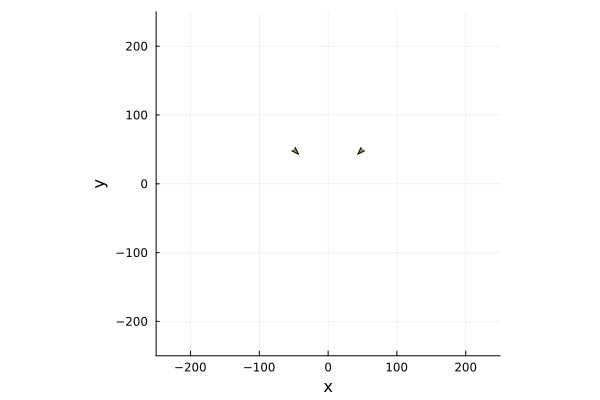

In [10]:
vel = [-1.0 -1.0; 1.0 -1.0]
pos = [50.0 50.0; -50.0 50.0]

n = 2
k = 2
speed = 3.0
factors = [1.0; 0.2]
radii = [10.0; 20.0]
factor_fns = [stubborn_direction, sep_direction]

model = BoidModel(n, k, pos, vel, speed, factors, radii)

anim = @animate for i in 1:100
    update!(model, factor_fns)
    plot(model)
end

gif(anim, "separation.gif", fps = 24)

# Alignment
Alignment describes the tendency of birds to travel in the same direction as their neighbours. The alignment factor function (called `match_direction`) computes the avergave velocity of a bird's neighbors, before normalising and returning it.

┌ Info: Saved animation to /Users/arnull/code/synthpop/notebooks/alignment.gif
└ @ Plots /Users/arnull/.julia/packages/Plots/3BCH5/src/animation.jl:156


Plots.AnimatedGif("/Users/arnull/code/synthpop/notebooks/alignment.gif")
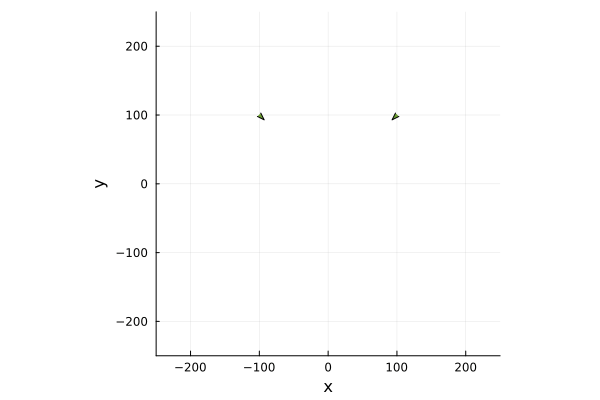

In [11]:
vel = [-1.0 -1.0; 1.0 -1.0]
pos = [100.0 100.0; -100.0 100.0]

n = 2
k = 2
speed = 3.0
factors = [1.0; 0.2]
radii = [10.0; 50.0]
factor_fns = [stubborn_direction, match_direction]

model = BoidModel(n, k, pos, vel, speed, factors, radii)

anim = @animate for i in 1:100
    update!(model, factor_fns)
    plot(model)
end

gif(anim, "alignment.gif", fps = 24)

# Avoidance
Avoidance describes the tendency of birds to avoid walls. Walls exist as `(-250, 0)`, `(250, 0)`, `(0, -250)`, and `(0, 250)`. If a bird is close to one of these walls, `(1, 0)`, `(-1, 0)`, `(0, -1)` or `(0, 1)` is added to the avoidance velocity respectively. The normalised avoidance velocity is then returned. The avoid factor function is called `avoid_direction`.

┌ Info: Saved animation to /Users/arnull/code/synthpop/notebooks/alignment.gif
└ @ Plots /Users/arnull/.julia/packages/Plots/3BCH5/src/animation.jl:156


Plots.AnimatedGif("/Users/arnull/code/synthpop/notebooks/alignment.gif")
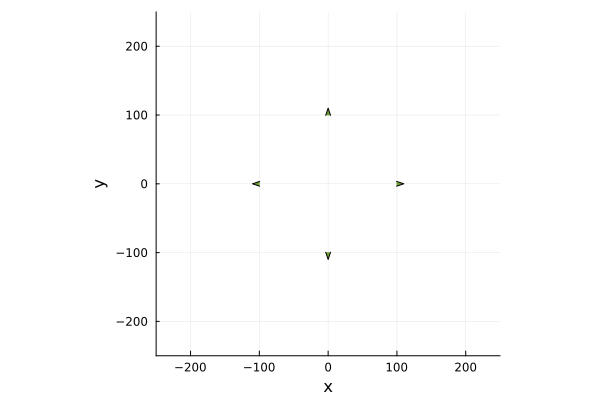

In [12]:
vel = [1.0 0.0; 0.0 1.0; -1.0 0.0; 0.0 -1.0]
pos = [100.0 0.0; 0.0 100.0; -100.0 0.0; 0.0 -100.0]

n = 4
k = 2
speed = 3.0
factors = [1.0; 5.0]
radii = [10.0; 30.0]
factor_fns = [stubborn_direction, avoid_direction]

model = BoidModel(n, k, pos, vel, speed, factors, radii)

anim = @animate for i in 1:80
    update!(model, factor_fns)
    plot(model)
end

gif(anim, "alignment.gif", fps = 24)

# Genrating Birds from Distributions

To generate birds from distributions we need to use the `Distributions` and `Random` packages. 

In [13]:
using Distributions
using Random
using LinearAlgebra

In particular we need to create a new sample that extended from `Sampleable{Multivariate,Continuous}` and override both `Distributions._rand!` and `Base.length`. 

In [14]:
struct BoidSampler<:Sampleable{Multivariate,Continuous}
    k::Int64
    pos_dstr::Sampleable{Multivariate, Continuous}
    vel_dstr::Sampleable{Multivariate, Continuous}
    speed::Union{Sampleable{Univariate, Discrete}, Sampleable{Univariate, Continuous}}
    avoid_factor::Union{Sampleable{Univariate, Discrete}, Sampleable{Univariate, Continuous}}
    factors::Sampleable{Multivariate, Continuous}
    avoid_radius::Union{Sampleable{Univariate, Discrete}, Sampleable{Univariate, Continuous}}
    radii::Sampleable{Multivariate, Continuous}
    len::Int64
    
    function BoidSampler(vel_means, vel_sigmas, speed, avoid_factor, 
            factor_means, avoid_radius, radii_means, radii_sigmas)
        k = length(factor_means) + 1
        len = 2*k + 5
        pos_dstr = product_distribution([Uniform(-250.0, 250.0), Uniform(-250.0, 250.0)])
        vel_dstr = product_distribution(Normal.(vel_means, vel_sigmas))
        factors = Dirichlet(factor_means)
        radii = product_distribution(LogNormal.(radii_means, radii_sigmas))
            
        new(k, pos_dstr, vel_dstr, Dirac(speed), Dirac(avoid_factor), 
            factors, Dirac(avoid_radius), radii, len)
    end
end

Base.length(sampler::BoidSampler) = sampler.len

function Distributions._rand!(rng::AbstractRNG, sampler::BoidSampler, x::AbstractVector{T}) where T<:Real
    x[1:2] = rand(sampler.pos_dstr)
    x[3:4] = rand(sampler.vel_dstr)
    x[3:4] = x[3:4] ./ norm(x[3:4])
    x[5] = rand(sampler.speed)
    x[6] = rand(sampler.avoid_factor)
    x[7:7+ sampler.k-2] = rand(sampler.factors)
    x[7+sampler.k-1] = rand(sampler.avoid_radius)
    x[7+sampler.k:sampler.len] = rand(sampler.radii)
    return x
end

Base.show(io::IO, model::BoidSampler) = print(io, "Basic Boid Sampler with ", sampler.k, " factors")

We have defined a sampler that will sample bird position and velocity independently. Likewise the weight on the avoid factor is sampled independently. The other factor weights are sampled from an initially unspecified joint distribution. To keep things simple, the avoid radius of each bird is also kept fixed. The other radii are sampled from an unspecified joint distribution.

In our constructor we choose to sample positions from a 2D `Uniform` distribution. We sample velocites from a 2D `Normal` distribution. The avoid factor weight is kept constant for each bird by sampling from a `Dirac` distribution. All remaining factor weights are sampled from a `Dirichlet` distribution, the interpretation being that a bird's new (unnormalised) velocity at each time step will be a weighted average of factor directions plus an adjustment term to ensure the bird does not hit a wall. The avoid radius for each bird is kept constant by sampling from a `Dirac` distribution. To ensure they are positive, the remaining radii for bird are sampled from a product of `LogNormal` distributions.

Note that the sampler returns a `2k + 5` length vector. The first two entries correspond to the bird's initial position, while the third and fourth describe the bird's initial velocity. The fifth entry defines the bird's speed. The next `k` entries define the bird's factor weights. The last `k` entries define the factor radii.

Before instantiating a sampler let's define helper functions for specifying the mean and variance of `LogNormal` distributions so our parameters are more intepretable.

In [15]:
convert_mean(des_mean, des_sigma) = log(des_mean ^ 2 / sqrt.(des_mean^2 + des_sigma^2))
convert_sigma(des_mean, des_sigma) = sqrt(log(1.0 + des_sigma^ 2 / des_mean^2))
   

convert_sigma (generic function with 1 method)

We are now ready to initialize our sampler!

In [16]:
vel_means = [0.0; 0.0]
vel_sigmas = [1.0; 1.0]
speed = 3.0
avoid_factor = 5.0
factor_means = [0.5; 0.2; 0.2; 0.1]
avoid_radius = 30.0
radii_des_means = [10.0; 30.0; 40.0; 50.0]
radii_des_sigmas = [10.0; 10.0; 20.0; 20.0]
radii_means = convert_mean.(radii_des_means, radii_des_sigmas)
radii_sigmas = convert_sigma.(radii_des_means, radii_des_sigmas)

sampler = BoidSampler(vel_means, vel_sigmas, speed, avoid_factor,
    factor_means, avoid_radius, radii_means, radii_sigmas)


Basic Boid Sampler with 5 factors

To initialise a model we only need to pass the number of bird `n`, the number of factors `k`, and our sampler. The constructor will randomly generate `n` birds using the sampler we supplied!

┌ Info: Saved animation to /Users/arnull/code/synthpop/notebooks/distribution.gif
└ @ Plots /Users/arnull/.julia/packages/Plots/3BCH5/src/animation.jl:156


Plots.AnimatedGif("/Users/arnull/code/synthpop/notebooks/distribution.gif")
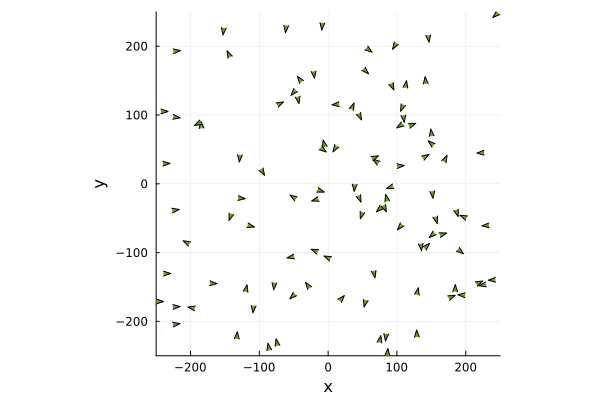

In [17]:
factor_fns = [avoid_direction, stubborn_direction, sep_direction, cohere_direction, match_direction]
n = 100
k = 5
model = BoidModel(n, k, sampler)

anim = @animate for i in 1:1000
    update!(model, factor_fns)
    plot(model)
end

gif(anim, "distribution.gif", fps = 24)